<a href="https://colab.research.google.com/github/christianbv/AgeNet/blob/main/0_Preprocessing_APPA_and_UTK_datasets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Imports

In [ ]:
#@markdown <b>Run me to import underscore module</b><br/>   {display-mode: "form"}
#@markdown <small>Method signatures:</small><br/> 
#@markdown <small><small>&nbsp; &nbsp; &nbsp; __(source_path, target_path, copy=True, auth_on_upload=True)</small></small><br/>
#@markdown <small><small>&nbsp; &nbsp; &nbsp; _set_gh_token(token)</small></small><br/>
#@markdown <small><small>&nbsp; &nbsp; &nbsp; _from_gh(user_name, repo_name, release_name) &nbsp; &nbsp; &nbsp; <b>Returns:</B> dictionary of arrays { 'array_name' : np.ndarray }</small></small><br/>
#@markdown <small><small>&nbsp; &nbsp; &nbsp; _to_gh(user_name, repo_name, release_name, split_size=600, **arr_kwargs)</small></small><br/>


!pip install -q githubrelease
import numpy as np
import os, glob, re, time
import github_release

compressed_dirs = set()


def _compress(source_path, target_path, target_dir=None):
    if target_dir:
        !mkdir -p {target_dir}
    if target_path.endswith('.tar.gz'):
        !tar -czf {target_path} -C {source_path} .
    elif target_path.endswith('.tar'):
        !tar -cf {target_path} -C {source_path} .
    elif target_path.endswith('.zip'):
        !(cd {source_path} && zip -q -r {target_path} .)


def _extract(source_path, target_path):
    !mkdir -p {target_path}
    if source_path.endswith('.tar.gz'):
        !tar -xzf {source_path} -C {target_path}
    elif source_path.endswith('.tar'):
        !tar -xf {source_path} -C {target_path}
    elif source_path.endswith('.zip'):
        !unzip -qq {source_path} -d {target_path}


def __(source_path, target_path, copy=True, auth_on_upload=True):
    """
    Use cases:
        Movement:
            - GCS -> GCS
            - GCS -> LOCAL
            - LOCAL -> GCS
            - LOCAL -> LOCAL
            
        Compression (e.g. from dir to .tar.gz):
            - GCS -> GCS
            - GCS -> LOCAL
            - LOCAL -> GCS
            - LOCAL -> LOCAL
            
        Extraction (e.g. from .zip to dir):
            - GCS -> GCS
            - GCS -> LOCAL
            - LOCAL -> GCS
            - LOCAL -> LOCAL
            
        Extraction & compression (e.g. from .zip to .tar.gz):
            - GCS -> GCS
            - GCS -> LOCAL
            - LOCAL -> GCS
            - LOCAL -> LOCAL
    """
    COMPRESSION_FORMATS = ('zip', 'tar', 'tar.gz')
    TEMP_DIR = "/tmp_"
    LOG_TEMPLATE = "{}    from    {}    to    {}"

    # Source
    if source_path.endswith("/"):
        source_path = source_path[:-1]
    source_dir, _, source_name = source_path.rpartition('/')
    source_isgcs = source_path.startswith("gs://")
    source_islocal = not source_isgcs
    if source_islocal:
        source_path = os.path.abspath(source_path)
    source_isprefix, source_isfile, source_ext = source_name.partition('.')
    source_isdir = not source_isfile
    source_iscompression = source_ext in COMPRESSION_FORMATS

    # Target
    target_dir, _, target_name = target_path.rpartition('/')
    target_isgcs = target_path.startswith("gs://")
    target_islocal = not target_isgcs
    target_prefix, target_isfile, target_ext = target_name.partition('.')
    target_isdir = not target_isfile
    target_iscompression = target_ext in COMPRESSION_FORMATS

    # Flags
    MOVE_ONLY = source_ext == target_ext
    GCS_ONLY = source_isgcs and target_isgcs
    RENAME = source_isprefix != target_prefix
    COMPRESSION = source_isdir and target_iscompression
    EXTRACTION = source_iscompression and target_isdir
    EXTRACTION_COMPRESSION = source_iscompression and target_iscompression and source_ext != target_ext

    # Add forward slash if file is at root level
    source_dir = "/" if not source_dir else source_dir
    target_dir = "/" if not target_dir else target_dir

    # Authenticate if writing to GCS
    if target_isgcs and auth_on_upload:
        from google.colab import auth
        auth.authenticate_user()

    # Assert that subdirectories exist if target is local
    if target_islocal:
        !mkdir -p {target_dir}

    # Movement commands
    if MOVE_ONLY:
        # GCS -> GCS
        if source_isgcs and target_isgcs:
            action = "COPYING" if copy else "MOVING"
            print(LOG_TEMPLATE.format(f"{action} (1/1)", source_path, target_path))
            if copy:
                !gsutil -m -q cp -r {source_path} {target_path}
            else:
                !gsutil -m -q mv {source_path} {target_path}
        
        # LOCAL -> LOCAL
        elif source_islocal and target_islocal:
            action = "COPYING" if copy else "MOVING"
            print(LOG_TEMPLATE.format(f"{action} (1/1)", source_path, target_path))
            if copy:
                !cp -r {source_path} {target_path}
            else:
                !mv {source_path} {target_path}
        
        # GCS -> LOCAL
        elif source_isgcs and target_islocal:
            if source_isdir:
                print(LOG_TEMPLATE.format("DOWNLOADING DIR (1/1)", source_path, target_dir))
                !gsutil -m -q cp -r {source_path} {target_dir}
                if RENAME:
                    print(LOG_TEMPLATE.format("\tRENAMING DIR", source_isprefix, target_prefix))
                    !mv {target_dir}/{source_isprefix} {target_dir}/{target_prefix}
            else:
                print(LOG_TEMPLATE.format("DOWNLOADING FILE (1/1)", source_path, target_path))
                !gsutil -m -q cp {source_path} {target_path}
        
        # LOCAL -> GCS
        if source_islocal and target_isgcs:
            if source_isdir:
                print(LOG_TEMPLATE.format("UPLOADING DIR (1/1)", source_path, target_path))
                !gsutil -m -q cp -r {source_path} {target_path}
            else:
                print(LOG_TEMPLATE.format("UPLOADING FILE (1/1)", source_path, target_path))
                !gsutil -m -q cp {source_path} {target_path}
        return


    # Create directory for intermediate storage if required
    if source_isgcs or target_isgcs or EXTRACTION_COMPRESSION:
        !mkdir -p {TEMP_DIR}
    

    # For remaining operations, download GCS source to temp and treat as local
    if source_isgcs:
        if source_isdir:
            print(LOG_TEMPLATE.format("\tDOWNLOADING DIR", source_path, TEMP_DIR))
            !gsutil -m -q cp -r {source_path} {TEMP_DIR}
        else:
            print(LOG_TEMPLATE.format("\tDOWNLOADING FILE", source_path, f"{TEMP_DIR}/{source_name}"))
            !gsutil -m -q cp {source_path} {TEMP_DIR}/{source_name}
        source_path = f"{TEMP_DIR}/{source_name}"
        source_dir = TEMP_DIR

    # Compression
    if COMPRESSION:
        if target_islocal:
            print(LOG_TEMPLATE.format("COMPRESSING (1/1)", source_path, target_path))
            _compress(source_path, target_path, target_dir=target_dir)
        else:
            print(LOG_TEMPLATE.format("COMPRESSING (1/2)", source_path, f"{TEMP_DIR}/{target_name}"))
            _compress(source_path, f"{TEMP_DIR}/{target_name}")
            print(LOG_TEMPLATE.format("UPLOADING FILE (2/2)", f"{TEMP_DIR}/{target_name}", target_path))
            !gsutil -m -q cp {TEMP_DIR}/{target_name} {target_path}

    # Extraction
    elif EXTRACTION:
        if target_islocal:
            print(LOG_TEMPLATE.format("EXTRACTING (1/1)", source_path, target_path))
            _extract(source_path, target_path)
        else:
            print(LOG_TEMPLATE.format("EXTRACTING (1/2)", source_path, f"{TEMP_DIR}/{target_name}"))
            _extract(source_path, f"{TEMP_DIR}/{target_name}")
            print(LOG_TEMPLATE.format("UPLOADING DIR (2/2)", f"{TEMP_DIR}/{target_name}", target_path))
            !gsutil -m -q cp -r {TEMP_DIR}/{target_name} {target_path}

    # Extraction & compression
    elif EXTRACTION_COMPRESSION:
        if target_islocal:
            print(LOG_TEMPLATE.format("EXTRACTING (1/2)", source_path, f"{TEMP_DIR}/{target_prefix}"))
            _extract(source_path, f"{TEMP_DIR}/{target_prefix}")
            print(LOG_TEMPLATE.format("COMPRESSING (2/2)", f"{TEMP_DIR}/{target_prefix}", target_path))
            _compress(f"{TEMP_DIR}/{target_prefix}", target_path, target_dir=target_dir)
        else:
            print(LOG_TEMPLATE.format("EXTRACTING (1/3)", source_path, f"{TEMP_DIR}/{target_prefix}"))
            _extract(source_path, f"{TEMP_DIR}/{target_prefix}")
            print(LOG_TEMPLATE.format("COMPRESSING (2/3)", f"{TEMP_DIR}/{target_prefix}", f"{TEMP_DIR}/{target_name}"))
            _compress(f"{TEMP_DIR}/{target_prefix}", f"{TEMP_DIR}/{target_name}")
            print(LOG_TEMPLATE.format("UPLOADING FILE (3/3)", f"{TEMP_DIR}/{target_name}", target_path))
            !gsutil -m -q cp {TEMP_DIR}/{target_name} {target_path}
    
    # Cleanup intermediate storage
    !rm -rf {TEMP_DIR}


def _set_gh_token(token):
    os.environ["GITHUB_TOKEN"] = token


def _export_array(array, release_name, prefix="", splits=3):
    dir_path = f"/tmp_/{release_name}"
    !mkdir -p {dir_path}
    n_digits = len(str(splits - 1))
    subarrays = np.array_split(array, splits)
    for i, subarray in enumerate(subarrays):
        filename = f"{prefix}__{str(i).zfill(n_digits)}.npy"
        np.save(f"{dir_path}/{filename}", subarray)


def _concat_arrays(paths):
    return np.concatenate([np.load(path, allow_pickle=True) for path in sorted(paths)])


def _to_gh(user_name, repo_name, release_name, split_size=600, **arr_kwargs):
    # Assert that GitHub Auth token is set
    if "GITHUB_TOKEN" not in os.environ:
        print("GitHub authentication token is not set.")
        print("Set token using the '_set_gh_token(token_string)' method.")
        print("Minimal required auth scope is 'repo/public_repo' for public repositories.")
        print("URL: https://github.com/settings/tokens/new")
        return

    # Split arrays
    for prefix, array in arr_kwargs.items():
        splits = int((array.nbytes/1_000_000) // split_size) + 1
        _export_array(array, release_name, prefix=prefix, splits=splits)

    # Upload arrays
    github_release.gh_release_create(
        f"{user_name}/{repo_name}", 
        release_name, 
        publish=True, 
        name=release_name, 
        asset_pattern=f"/tmp_/{release_name}/*"
    )
    !rm -rf /tmp_/*


def _from_gh(user_name, repo_name, release_name):
    # Download release to temporary directory
    print("Downloading dataset in parallell ... ", end='\t')
    t0 = time.perf_counter()
    assets = github_release.get_assets(f"{user_name}/{repo_name}", tag_name=release_name)
    download_urls = [asset['browser_download_url'] for asset in assets]
    urls_str = " ".join(download_urls)
    !echo {urls_str} | xargs -n 1 -P 8 wget -q -P /tmp_/{release_name}_dl/
    t1 = time.perf_counter()
    print(f"done! ({t1 - t0:.3f} seconds)")

    # Load data into numpy arrays
    paths = glob.glob(f"/tmp_/{release_name}_dl/*.npy")
    groups = {}
    for path in paths:
        match = re.match(r".*/(.*)__[0-9]*\.npy", path)
        if match:
            prefix = match.group(1)
            groups[prefix] = groups.get(prefix, []) + [path]
    arrays_dict = {name: _concat_arrays(paths) for name, paths in groups.items()}
    !rm -rf /tmp_/*
    return arrays_dict
    

def _log_to_gh(user, repo, tag, log_dir="/tmp/logs"):
    # Create temporary directory for compressed logs
    !mkdir -p /tmp/compressed_logs
    
    # Compress all directories in log dir
    for dirname in os.listdir(log_dir):
        # Skip files
        if "." in dirname or dirname in compressed_dirs:
            continue

        # Compress
        __(f"{log_dir}/{dirname}", f"/tmp/compressed_logs/{dirname}.tar.gz")
        compressed_dirs.add(dirname)

    # Upload compressed logs to GitHub
    github_release.gh_asset_upload(f"{user}/{repo}", tag, f"/tmp/compressed_logs/*.tar.gz")

    # Cleanup compressed logs
    !rm -rf /tmp/compressed_logs/*

In [ ]:
!pip install dlib
!pip install face_recognition

     |████████████████████████████████| 100.2MB 42kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566173 sha256=1ca7289370b6be6e750d437a4e17c00d636fe9a48c539b8f46ef5eda59c21600
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


In [ ]:
from google.colab import auth
from google.colab import drive
from os import walk 
from os import listdir
from os.path import isfile, join
from IPython.display import display
from PIL import Image, ImageDraw
import pandas as pd
import numpy as np
import glob
import shutil
import face_recognition

# 1. Initialize Methods

In [ ]:
""" The used methods """

def crop_to_face(im):
  im_array = np.asarray(im)
  try:
    face_location = face_recognition.face_locations(im_array)
  except:
    print("!!! ERROR: Might be an unsuported image !!! ")
    return None


  #If no face was detected
  if not face_location:
    #print("Didn't find a face")
    #display(im)
    return None

  top, right, bottom, left = face_location[0]
  box_size = abs(right-left)
  padding = box_size*0.4
  im_cropped = im.crop((left-padding,top-padding, right+padding, bottom+padding))
  return im_cropped


def save_image(file_path, bin_label, file_name, im):
  folder_path = file_path + "/" + bin_label
  if not os.path.exists(folder_path):
    os.makedirs(folder_path)
  else: 
   im.save(folder_path + "/" + file_name)

def save_image(file_path, file_name, im):
  folder_path = file_path + "/" 
  if not os.path.exists(folder_path):
    os.makedirs(folder_path)
  else: 
   im.save(folder_path + "/" + file_name)

def get_bin_age(buckets, age):
  for i in range(len(buckets)):
    if age < buckets[i]:
      return f"{buckets[i-1]}-{buckets[i]-1}"
  return "undf"

  
def backup_to_bucket(colab_folder, bucket_folder):
  id = np.random.randint(1,10000)
  num =   len(glob.glob(colab_folder + "/*.jpg", recursive=True))

  __(colab_folder, bucket_folder + "/backup-" + str(num) +"-id-" + str(id) + ".zip")
  print(f"Successfully backed up {num} pictures")

In [ ]:
# Gjør om til bins:

import shutil
import os

OLD_FOLDER_PATH = '/content/appa_images'
NEW_FOLDER_PATH = '/content/appa_images_fixed'
BUCKETS =[0,3,7,13,18,23,27,34,45,60,200]

def get_bin_age(buckets, age):
  for i in range(len(buckets)):
    if int(age) < buckets[i]:
      return f"{buckets[i-1]}-{buckets[i]-1}"
  return "undf"

def convert_folder_to_bins(OLD_FOLDER_PATH, NEW_FOLDER_PATH, BUCKETS):

  # Lager base folder hvis den ikke allerede eksisterer
  if not os.path.exists(NEW_FOLDER_PATH):
    os.makedirs(NEW_FOLDER_PATH) 

  # Lager nye subfolders hvis de ikke allerede eksisterer, under base_folder:
  for (dirpath, dirnames, filenames) in walk (OLD_FOLDER_PATH):
    for f in filenames:
      if f.endswith(".jpg"):
        # Get label for filename
        age = f.split("_")[0]
        bin_age = get_bin_age(BUCKETS,age)

        print(age)

        if bin_age == 'undf':
          continue

        if not os.path.exists(NEW_FOLDER_PATH + "/" + bin_age):
          os.makedirs(NEW_FOLDER_PATH + "/" + bin_age)

        # Move to correct folder
        shutil.move(dirpath + "/" + f, NEW_FOLDER_PATH + "/" + str(bin_age) + "/" + f)

convert_folder_to_bins(OLD_FOLDER_PATH, NEW_FOLDER_PATH, BUCKETS)

# Preprocess APPA Dataset

In [ ]:
__("gs://ntnu-ml-bucket/Appa/appa_images.zip", "/content/appa")

	DOWNLOADING FILE    from    gs://ntnu-ml-bucket/Appa/appa_images.zip    to    /tmp_/appa_images.zip
EXTRACTING (1/1)    from    /tmp_/appa_images.zip    to    /content/appa


Saved saved new images


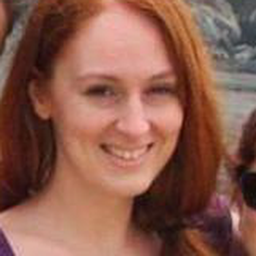

Saved saved new images


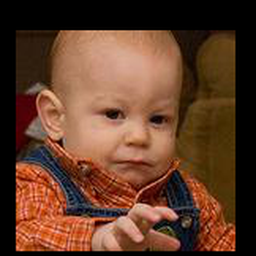

Saved saved new images


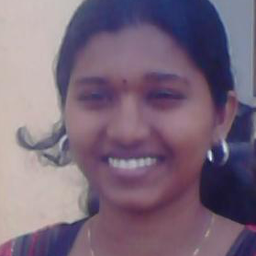

Saved saved new images


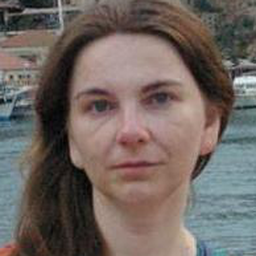

Saved saved new images


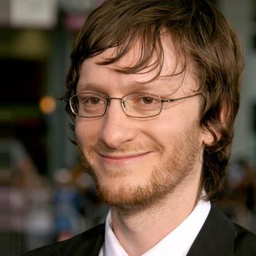

Saved saved new images


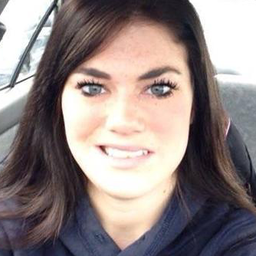

Saved saved new images


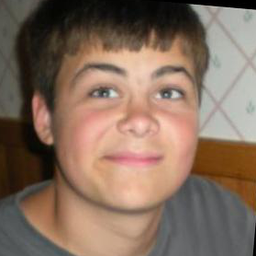

Saved saved new images


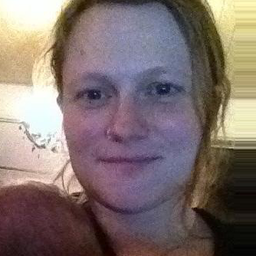

Saved saved new images


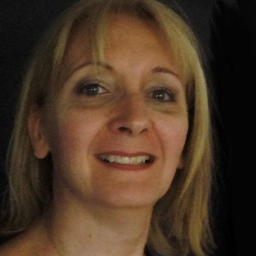

Saved saved new images


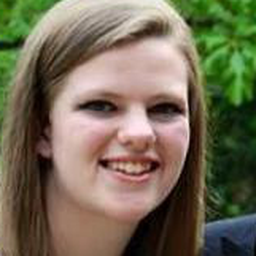

COMPRESSING (1/2)    from    /content/appa_by_age    to    /tmp_/backup-2022-id-1677.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-2022-id-1677.zip    to    gs://ntnu-ml-bucket/Appa/appa_258/backup-2022-id-1677.zip
Successfully backed up 2022 pictures
Saved saved new images


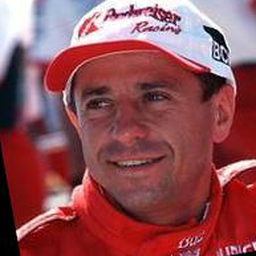

Saved saved new images


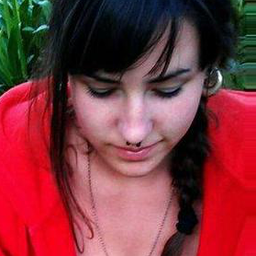

Saved saved new images


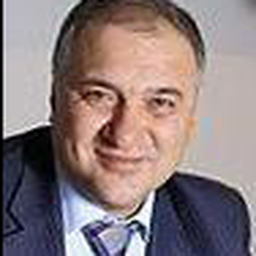

Saved saved new images


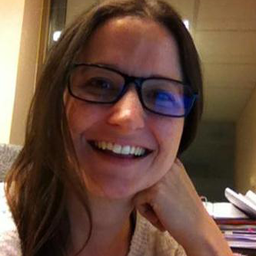

Saved saved new images


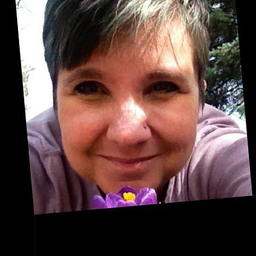

Saved saved new images


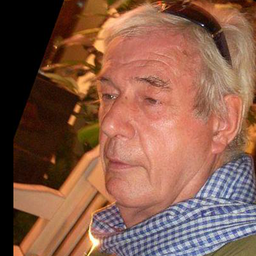

Saved saved new images


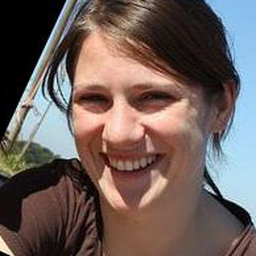

Saved saved new images


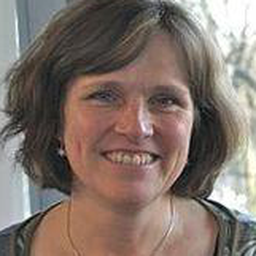

Saved saved new images


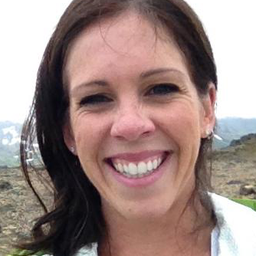

Saved saved new images


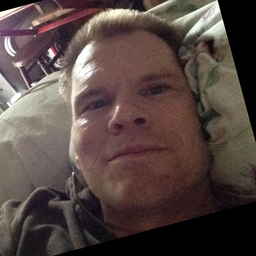

COMPRESSING (1/2)    from    /content/appa_by_age    to    /tmp_/backup-4022-id-7067.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-4022-id-7067.zip    to    gs://ntnu-ml-bucket/Appa/appa_258/backup-4022-id-7067.zip
Successfully backed up 4022 pictures
Saved saved new images


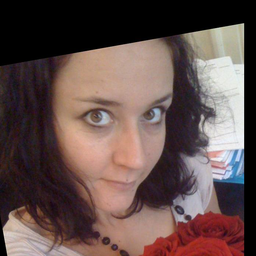

Saved saved new images


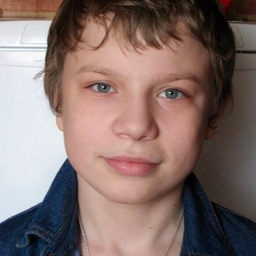

Saved saved new images


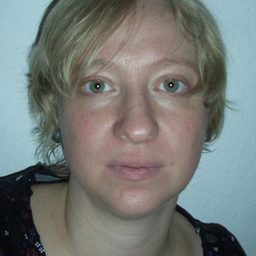

Saved saved new images


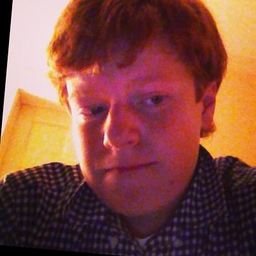

Saved saved new images


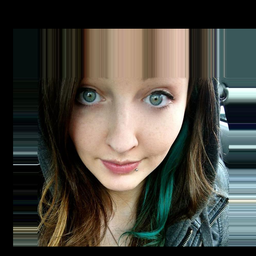

Saved saved new images


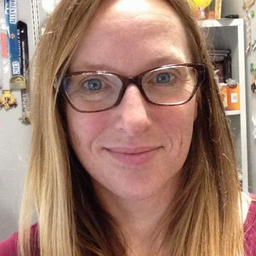

Saved saved new images


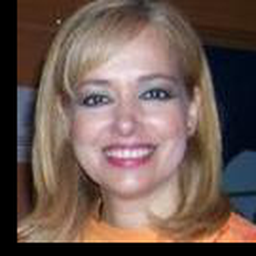

Saved saved new images


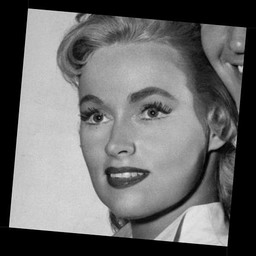

Saved saved new images


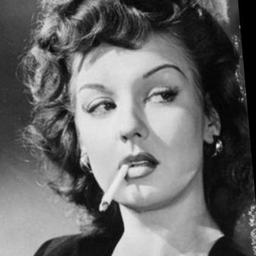

Saved saved new images


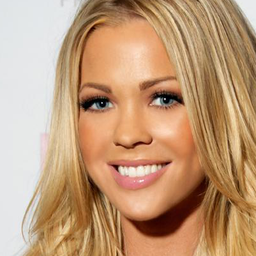

COMPRESSING (1/2)    from    /content/appa_by_age    to    /tmp_/backup-6022-id-9103.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-6022-id-9103.zip    to    gs://ntnu-ml-bucket/Appa/appa_258/backup-6022-id-9103.zip
Successfully backed up 6022 pictures
Saved saved new images


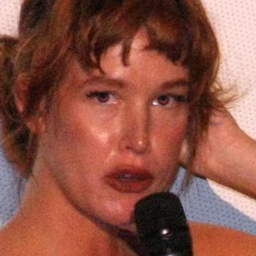

Saved saved new images


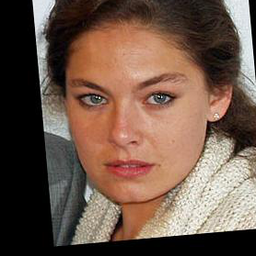

Saved saved new images


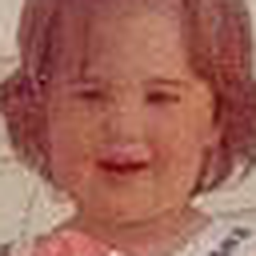

Saved saved new images


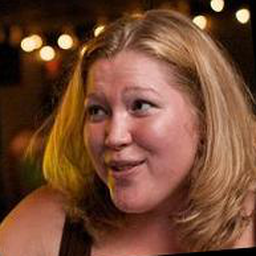

Saved saved new images


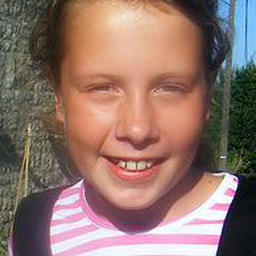

Saved 7180 pictures
22 already existed
COMPRESSING (1/2)    from    /content/appa_by_age    to    /tmp_/backup-7202-id-8205.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-7202-id-8205.zip    to    gs://ntnu-ml-bucket/Appa/appa_258/backup-7202-id-8205.zip
Successfully backed up 7202 pictures


In [ ]:
SAVE_FOLDER = "/content/appa_by_age"
IMAGES_FOLDER = "/content/appa/final_files/final_files"
IMG_HEIGHT = 256
IMG_WIDTH = 256

saved = 0
existing = 0
satisfied = 20000

df = pd.read_csv("/content/appa/labels.csv")

""" Used when we want bins"""

#BUCKETS = [0,3,7,13,18,23,27,34,45,60,200]
# for i in df.iterrows():
#   bin_label = get_bin_age(BUCKETS, i[1][1])

#   # Check if image already saved
#   if os.path.isfile(SAVE_FOLDER + "/"+ bin_label + "/" + i[1][0]):
#     existing +=1
#     if((existing % 500) == 0): 
#       print(f"Found {existing} already existing")
#     continue

#   im = Image.open(IMAGES_FOLDER + "/" + i[1][0])
#   im = crop_to_face(im)
#   if(im == None):
#     continue
#   im = im.resize((IMG_WIDTH,IMG_HEIGHT),Image.ANTIALIAS)
 
#   save_image(SAVE_FOLDER, bin_label, i[1][0], im)

#   saved +=1
#   if saved % 50 == 0: 
#     print("Saved 50 new images")
#     display(im)

#   if(saved >= satisfied):break

# print(f"Saved {saved} pictures")
# print(f"{existing} already existed")    

""" Usen when we do not want bins """ 

for i in df.iterrows():
  # Check if image already saved
  if os.path.isfile(SAVE_FOLDER + "/" + str(i[1][1]) + "_" + i[1][0]):
    existing +=1
    if((existing % 500) == 0): 
      print(f"Found {existing} already existing")
    continue

  im = Image.open(IMAGES_FOLDER + "/" + i[1][0])
  im = crop_to_face(im)
  if(im == None):
    continue
  im = im.resize((IMG_WIDTH,IMG_HEIGHT),Image.ANTIALIAS)
 
  save_image(SAVE_FOLDER, str(i[1][1]) + "_" + i[1][0] ,  im)

  saved +=1
  if saved % 200 == 0: 
    print("Saved saved new images")
    display(im)


  if(saved % 2000 == 0):
    backup_to_bucket(SAVE_FOLDER, "gs://ntnu-ml-bucket/Appa/appa_258")

  if(saved >= satisfied):break

print(f"Saved {saved} pictures")
print(f"{existing} already existed")  
backup_to_bucket(SAVE_FOLDER, "gs://ntnu-ml-bucket/Appa/appa_258")  


In [ ]:
#__("/content/appa_by_age", "gs://ntnu-ml-bucket/Utk/appa_images_256.zip")

# Preprocess UTK dataset


In [ ]:
__("gs://ntnu-ml-bucket/Utk/utk_images_wild.zip", "/content/utk_images")_

	DOWNLOADING FILE    from    gs://ntnu-ml-bucket/Utk/utk_images_wild.zip    to    /tmp_/utk_images_wild.zip
EXTRACTING (1/1)    from    /tmp_/utk_images_wild.zip    to    /content/utk_images


Saved 200 new images


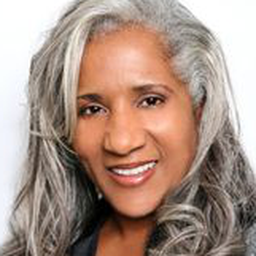

Saved 400 new images


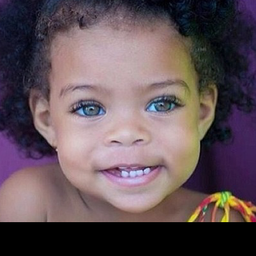

Processed 500
Saved 600 new images


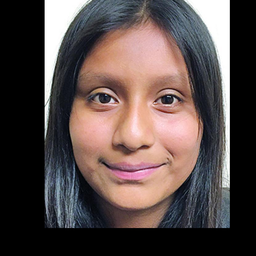

Saved 800 new images


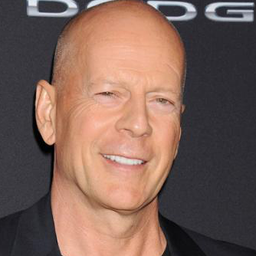

!!! ERROR: Might be an unsuported image !!! 
Processed 1000
Saved 1000 new images


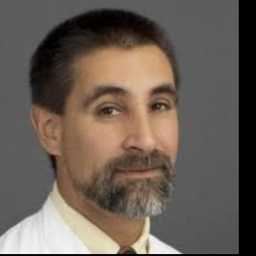

Saved 1200 new images


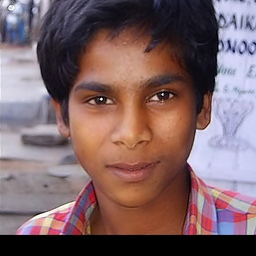

Saved 1400 new images


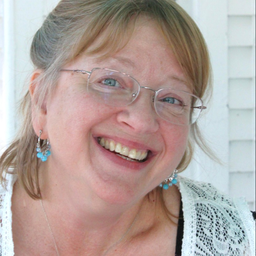

Processed 1500
Saved 1600 new images


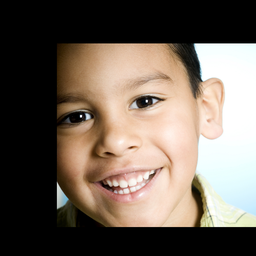

!!! ERROR: Might be an unsuported image !!! 
Saved 1800 new images


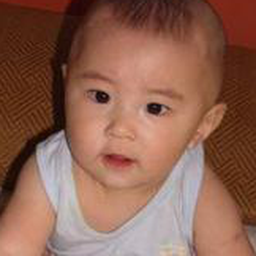

Processed 2000
Saved 2000 new images


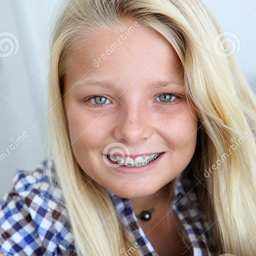

Saved 2200 new images


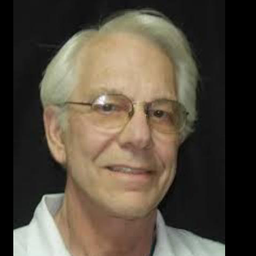

Saved 2400 new images


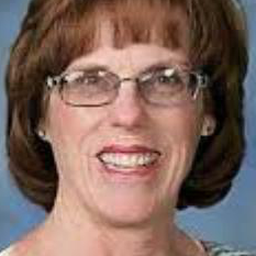

Processed 2500
Saved 2600 new images


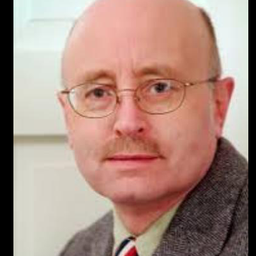

Saved 2800 new images


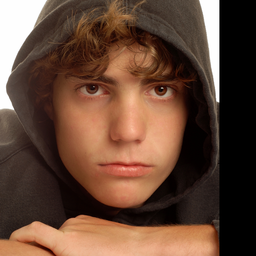

!!! ERROR: Might be an unsuported image !!! 
Processed 3000
Saved 3000 new images


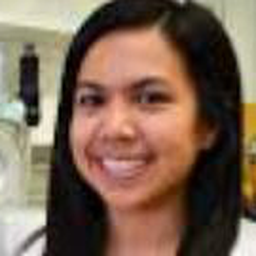

Saved 3200 new images


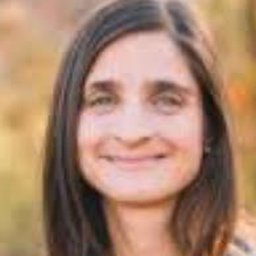

Processed 3500
Saved 3400 new images


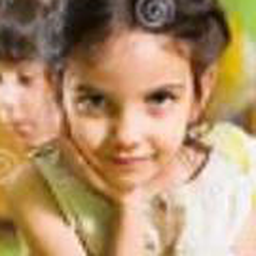

Saved 3600 new images


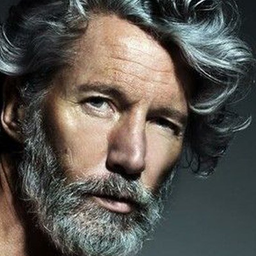

Saved 3800 new images


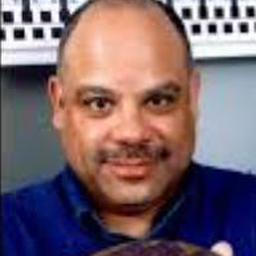

Processed 4000
!!! ERROR: Might be an unsuported image !!! 
Saved 4000 new images


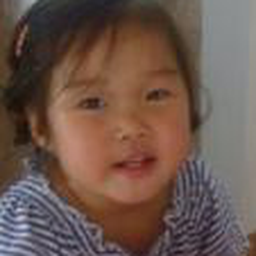

COMPRESSING (1/2)    from    /content/utk_by_age    to    /tmp_/backup-3999-id-9975.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-3999-id-9975.zip    to    gs://ntnu-ml-bucket/Utk/utk_258/backup-3999-id-9975.zip
Successfully backed up 3999 pictures
Saved 4200 new images


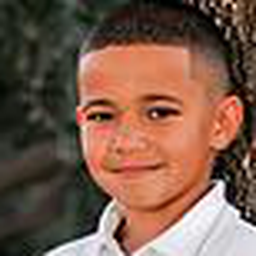

Processed 4500
Saved 4400 new images


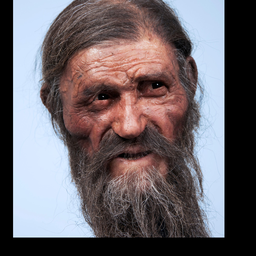

!!! ERROR: Might be an unsuported image !!! 
Saved 4600 new images


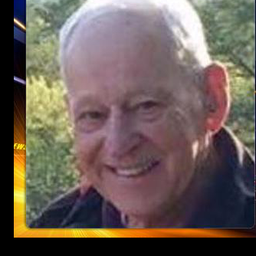

Saved 4800 new images


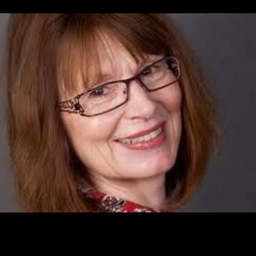

Processed 5000
Saved 5000 new images


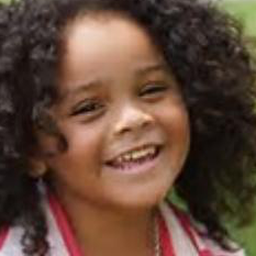

Saved 5200 new images


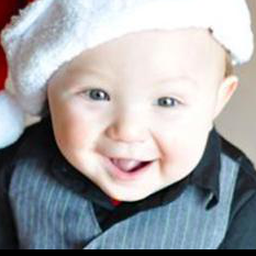

Processed 5500
Saved 5400 new images


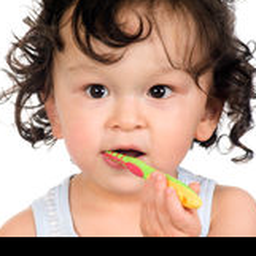

!!! ERROR: Might be an unsuported image !!! 
Saved 5600 new images


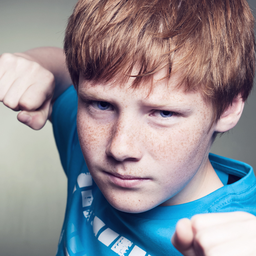

Processed 6000
!!! ERROR: Might be an unsuported image !!! 
Saved 5800 new images


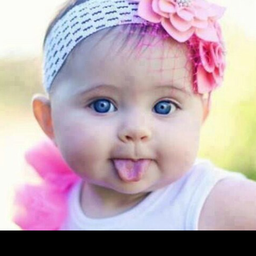

Saved 6000 new images


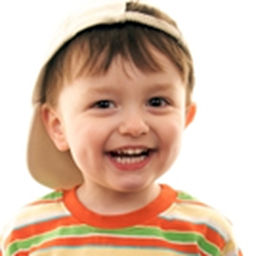

Saved 6200 new images


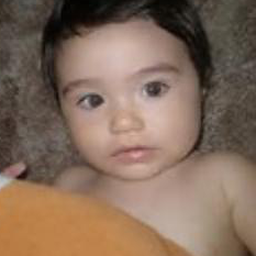

Processed 6500
Saved 6400 new images


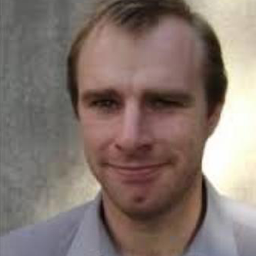

Saved 6600 new images


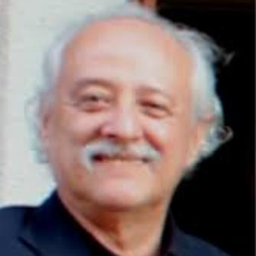

Processed 7000
Saved 6800 new images


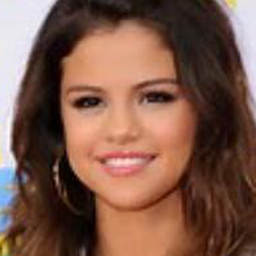

Saved 7000 new images


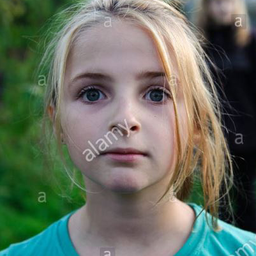

Saved 7200 new images


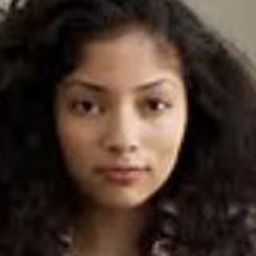

Processed 7500
!!! ERROR: Might be an unsuported image !!! 
Saved 7400 new images


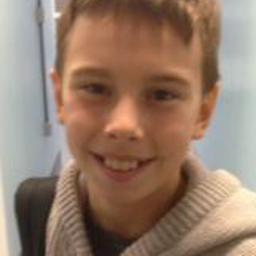

Saved 7600 new images


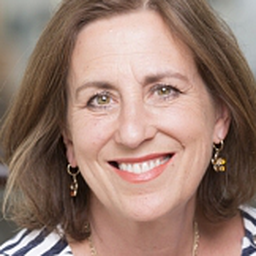

Processed 8000
Saved 7800 new images


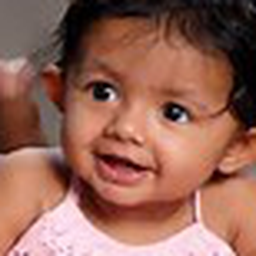

Saved 8000 new images


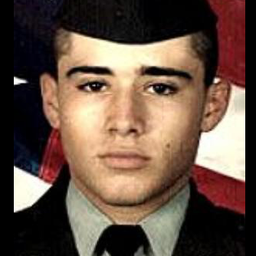

COMPRESSING (1/2)    from    /content/utk_by_age    to    /tmp_/backup-7999-id-5615.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-7999-id-5615.zip    to    gs://ntnu-ml-bucket/Utk/utk_258/backup-7999-id-5615.zip
Successfully backed up 7999 pictures
Processed 8500
Saved 8200 new images


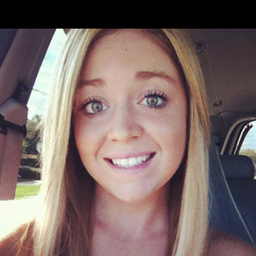

Saved 8400 new images


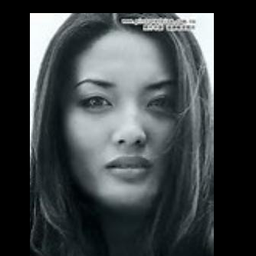

Saved 8600 new images


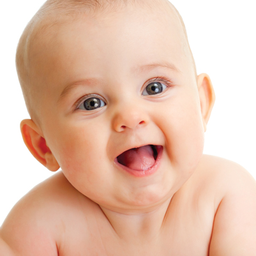

Processed 9000
Saved 8800 new images


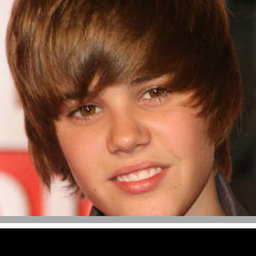

!!! ERROR: Might be an unsuported image !!! 
Saved 9000 new images


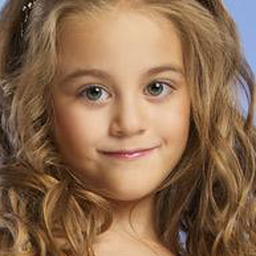

Processed 9500
Saved 9200 new images


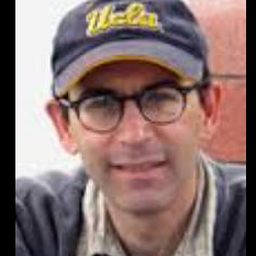

Saved 9400 new images


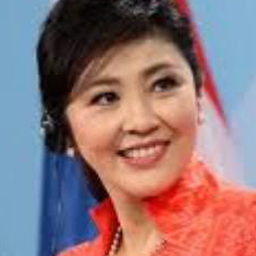

Saved 9600 new images


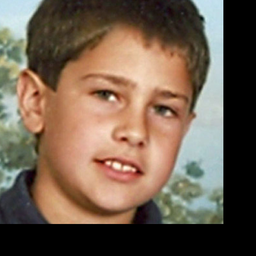

Processed 10000
Saved 9800 new images


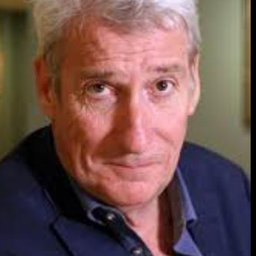

Saved 10000 new images


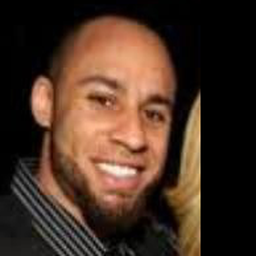

Processed 10500
Saved 10200 new images


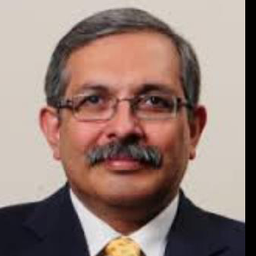

Saved 10400 new images


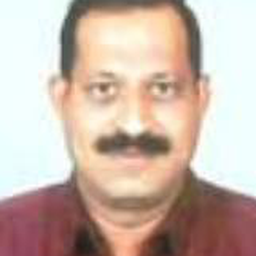

Saved 10600 new images


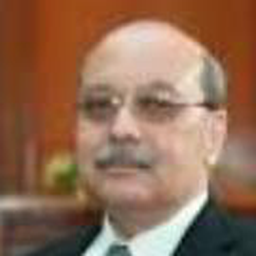

Processed 11000
Saved 10800 new images


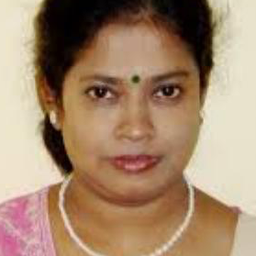

Saved 11000 new images


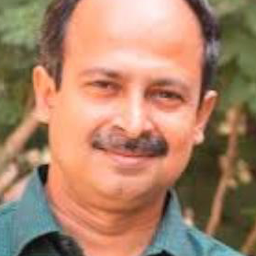

Processed 11500
Saved 11200 new images


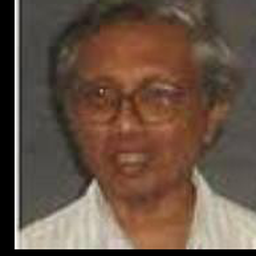

Saved 11400 new images


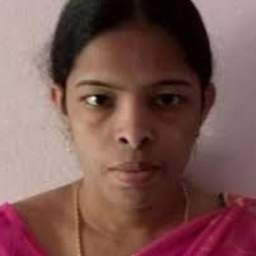

Saved 11600 new images


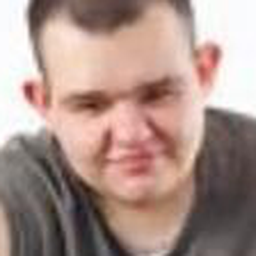

Processed 12000
Saved 11800 new images


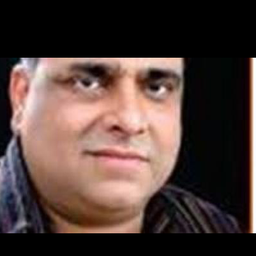

Saved 12000 new images


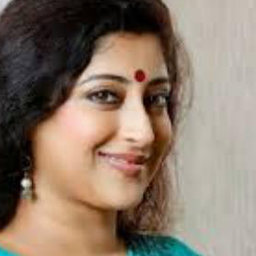

COMPRESSING (1/2)    from    /content/utk_by_age    to    /tmp_/backup-11999-id-7007.zip
UPLOADING FILE (2/2)    from    /tmp_/backup-11999-id-7007.zip    to    gs://ntnu-ml-bucket/Utk/utk_258/backup-11999-id-7007.zip
Successfully backed up 11999 pictures
Processed 12500
Saved 12200 new images


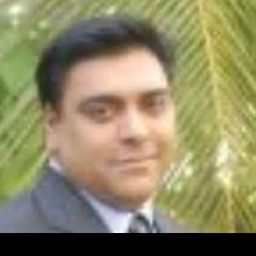

Saved 12400 new images


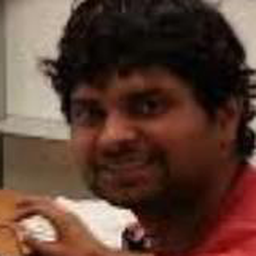

Processed 13000
Saved 12600 new images


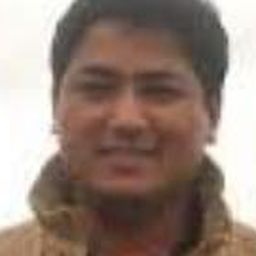

Saved 12800 new images


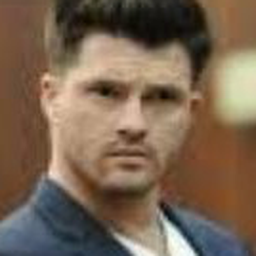

Saved 13000 new images


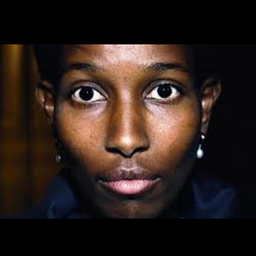

Processed 13500
Saved 13200 new images


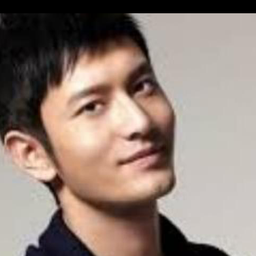

Saved 13400 new images


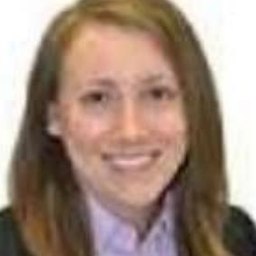

Processed 14000
Saved 13600 new images


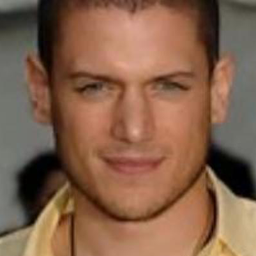

Saved 13800 new images


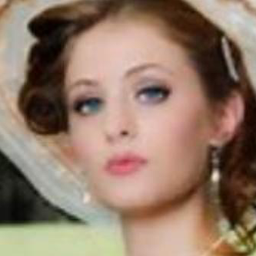

Saved 14000 new images


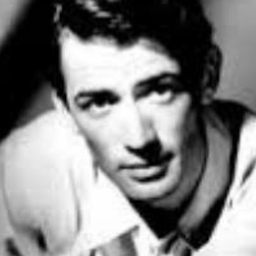

Processed 14500


In [ ]:
SAVE_FOLDER = "/content/utk_by_age"
IMG_HEIGHT = 256
IMG_WIDTH = 256



saved = 0
processed = 0
satisfied = 22000
existing = 0

""" Used when we want bins"""

# BUCKETS = [0,3,7,13,18,23,27,34,45,60,200]
# for (dirpath, dirnames, filenames) in walk ("/content/utk_images"):
#   for f in filenames:
#     if f.endswith(".jpg"):
#       processed += 1
#       if((processed % 500) == 0): print(f"Processed {processed}")
#       info = f.split("_")
#       if (len(info) <3):
#         continue
#       age, gender, etnisity, *time = info
#       if(not age.isdigit()):
#         continue

#       bin_label = get_bin_age(BUCKETS, int(age))

#       if os.path.isfile(SAVE_FOLDER + "/"+ bin_label + "/" + f):
#         existing +=1
#         if((existing % 500) == 0): 
#           print(f"Found {existing} already existing")
#         continue

#       im = Image.open(dirpath + "/" + f)
#       #print(im.size)
#       im = crop_to_face(im)
    
#       if(im == None):
#         continue
#       im = im.resize((IMG_HEIGHT,IMG_WIDTH), Image.ANTIALIAS)
      
#       #display(im)
#       saved += 1
#       if((saved % 200) == 0): 
#         print(f"Saved {saved} new images")
#         display(im)
#       save_image(SAVE_FOLDER,bin_label,f, im)
#       if saved > satisfied:
#         break
#     if saved > satisfied:
#       break


""" Used when we do not want bins """ 

for (dirpath, dirnames, filenames) in walk ("/content/utk_images"):
  for f in filenames:
    if f.endswith(".jpg"):
      processed += 1
      if((processed % 500) == 0): print(f"Processed {processed}")
      info = f.split("_")
      if (len(info) <3):
        continue
      age, gender, etnisity, *time = info
      if(not age.isdigit()):
        continue


      if os.path.isfile(SAVE_FOLDER + "/"+ f):
        existing +=1
        if((existing % 500) == 0): 
          print(f"Found {existing} already existing")
        continue

      im = Image.open(dirpath + "/" + f)
      im = crop_to_face(im)
    
      if(im == None):
        continue
      im = im.resize((IMG_HEIGHT,IMG_WIDTH), Image.ANTIALIAS)

      saved += 1
      if((saved % 200) == 0): 
        print(f"Saved {saved} new images")
        display(im)
      save_image(SAVE_FOLDER,f, im)


      if(saved % 4000 == 0):
        backup_to_bucket(SAVE_FOLDER, "gs://ntnu-ml-bucket/Utk/utk_258")
        

      if saved > satisfied:
        break
    if saved > satisfied:
      break



print(f"Saved {saved} pictures")
print(f"{existing} already existed")    
backup_to_bucket(SAVE_FOLDER, "gs://ntnu-ml-bucket/Utk/utk_258")  